# Formalia:

Please read the [assignment overview page](https://github.com/suneman/socialgraphs2025/wiki/Assignments) carefully before proceeding. This page contains information about formatting (including formats etc), group sizes, and many other aspects of handing in the assignment. 

_If you fail to follow those simple instructions, it will negatively impact your grade!_

**Due date and time**: The assignment is due on Tuesday November 4th, 2025 at 23:55. Hand in your IPython notebook file (with extension `.ipynb`) via DTU Learn

In the exercises below, I describe the exercises in a general way. Drawing in the right parts of the exercises is part of the assignment. (That way we're helping you get a little bit more ready for the Final Project, where you have to decide what information to include in your report and analysis). 

# Part 1: Analyze the network

The questions in this part are based on Lecture 5.

* Present an analysis/description of the network of bands/artists using tools from Lecture 5. Imagine that you have been tasked with presenting the important facts about the network to an audience who knows about network science, but doesn't know about this particular network.
   - It's OK to also use basic concepts like degree distributions (even though they're from week 4) in your analysis. That way you can make the analysis a standalone, coherent thing.
   - I would like you to include concepts like centrality and assortativity in your analysis.
   - Use a network backbone in your analysis.
   - In addition to standard distribution plots (e.g. degree distributions, etc), your analysis should also include at least one network visualization (but it doesn't have to display the entire network, you can also visualize a network backbone).
   - **Note**: As I write above, an important part of the exercise consists is *selecting the right elements of the lecture* to create a meaningful analysis. So don't solve this part by going exhaustive and just calculating everything you can think of in one massive analysis. Try to focus on using what you've learned to characterize the network. 

# Part 2: Genres and communities and plotting 

The questions below are based on Lecture 7, part 2.

* Write about genres and modularity.
* Detect the communities, discuss the value of modularity in comparison to the genres.
* Calculate the matrix $D$ and discuss your findings.
* Plot the communities and comment on your results.

# Part 3: TF-IDF to understand genres and communities 

The questions below  are based on Lecture 7, part 2, 4, 5, 6 (and a little bit on part 3).

* Explain the concept of TF-IDF in your own words and how it can help you understand the genres and communities.
* Calculate and visualize TF-IDF for the genres and communities.
* Use the matrix $D$ (Lecture 7, part 2) to dicusss the difference between the word-clouds between genres and communities.

# Part 4: Sentiment of the artists and communities

The questions below are based on Lecture 8

* Calculate the sentiment of the band/artist pages (it is OK to work with the sub-network of artists-with-genre) and describe your findings using stats and visualization, inspired by the first exercise of week 8.
* Discuss the sentiment of the communities. Do the findings using TF-IDF during Lecture 7 help you understand your results?

# Solutions

## Part 1

In [23]:
# 1. BASIC NETWORK LOADING AND STATISTICS
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Load the network
G_directed = nx.read_gml('WRG.gml')
G = G_directed.to_undirected()

# Get largest connected component
if not nx.is_connected(G):
    components = list(nx.connected_components(G))
    G = G.subgraph(max(components, key=len)).copy()

print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")
print(f"Network density: {nx.density(G):.6f}")
print(f"Average clustering coefficient: {nx.average_clustering(G):.4f}")

Number of nodes: 486
Number of edges: 5871
Network density: 0.049815
Average clustering coefficient: 0.2374


Max degree: 127
Min degree: 1


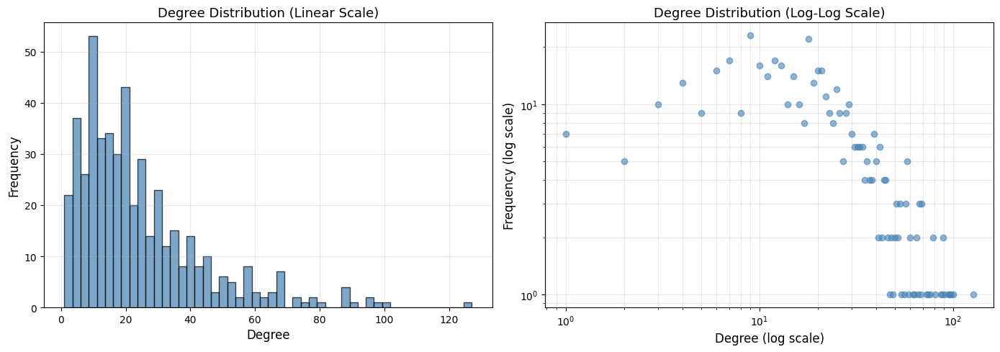


Top 10 most connected artists:
 1. [[Led Zeppelin]]                         - Degree: 127
 2. [[Queen (band)|Queen]]                   - Degree: 100
 3. [[Bob Dylan]]                            - Degree: 98
 4. [[Deep Purple]]                          - Degree: 96
 5. [[Metallica]]                            - Degree: 95
 6. [[David Bowie]]                          - Degree: 91
 7. [[Alice in Chains]]                      - Degree: 89
 8. [[Black Sabbath]]                        - Degree: 89
 9. [[Guns N' Roses]]                        - Degree: 88
10. [[Jimi Hendrix]]                         - Degree: 87


In [24]:
# 2. DEGREE DISTRIBUTION ANALYSIS
degrees = [d for n, d in G.degree()]
degree_counts = Counter(degrees)

#print(f"Average degree: {np.mean(degrees):.2f}")
#print(f"Median degree: {np.median(degrees):.2f}")
print(f"Max degree: {max(degrees)}")
print(f"Min degree: {min(degrees)}")

# Plot degree distribution (linear and log-log)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Linear scale
axes[0].hist(degrees, bins=50, edgecolor='black', alpha=0.7, color='steelblue')
axes[0].set_xlabel('Degree', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_title('Degree Distribution (Linear Scale)', fontsize=13)
axes[0].grid(True, alpha=0.3)

# Log-log scale
degree_values = sorted(degree_counts.keys())
degree_freqs = [degree_counts[k] for k in degree_values]
axes[1].loglog(degree_values, degree_freqs, 'o', alpha=0.6, color='steelblue')
axes[1].set_xlabel('Degree (log scale)', fontsize=12)
axes[1].set_ylabel('Frequency (log scale)', fontsize=12)
axes[1].set_title('Degree Distribution (Log-Log Scale)', fontsize=13)
axes[1].grid(True, alpha=0.3, which="both")

plt.tight_layout()
plt.show()

# Top 10 most connected artists
top_degree = sorted(G.degree(), key=lambda x: x[1], reverse=True)[:10]
print("\nTop 10 most connected artists:")
for i, (artist, degree) in enumerate(top_degree, 1):
    print(f"{i:2d}. {artist:40s} - Degree: {degree}")

In [25]:
# 3. CENTRALITY MEASURES

# Degree Centrality
degree_centrality = nx.degree_centrality(G)
top_degree_cent = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("\nTop 10 by Degree Centrality:")
for i, (artist, cent) in enumerate(top_degree_cent, 1):
    print(f"{i:2d}. {artist:40s} - {cent:.4f}")

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("\nTop 10 by Betweenness Centrality:")
for i, (artist, cent) in enumerate(top_betweenness, 1):
    print(f"{i:2d}. {artist:40s} - {cent:.4f}")

# Eigenvector Centrality
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)
top_eigenvector = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

print("\nTop 10 by Eigenvector Centrality:")
for i, (artist, cent) in enumerate(top_eigenvector, 1):
    print(f"{i:2d}. {artist:40s} - {cent:.4f}")
    


Top 10 by Degree Centrality:
 1. [[Led Zeppelin]]                         - 0.2619
 2. [[Queen (band)|Queen]]                   - 0.2062
 3. [[Bob Dylan]]                            - 0.2021
 4. [[Deep Purple]]                          - 0.1979
 5. [[Metallica]]                            - 0.1959
 6. [[David Bowie]]                          - 0.1876
 7. [[Alice in Chains]]                      - 0.1835
 8. [[Black Sabbath]]                        - 0.1835
 9. [[Guns N' Roses]]                        - 0.1814
10. [[Jimi Hendrix]]                         - 0.1794

Top 10 by Betweenness Centrality:
 1. [[Led Zeppelin]]                         - 0.0479
 2. [[Bob Dylan]]                            - 0.0386
 3. [[Queen (band)|Queen]]                   - 0.0320
 4. [[Deep Purple]]                          - 0.0309
 5. [[Jimi Hendrix]]                         - 0.0282
 6. [[David Bowie]]                          - 0.0251
 7. [[U2]]                                   - 0.0236
 8. [[Guns N' Ros

Degree Assortativity Coefficient: 0.0048


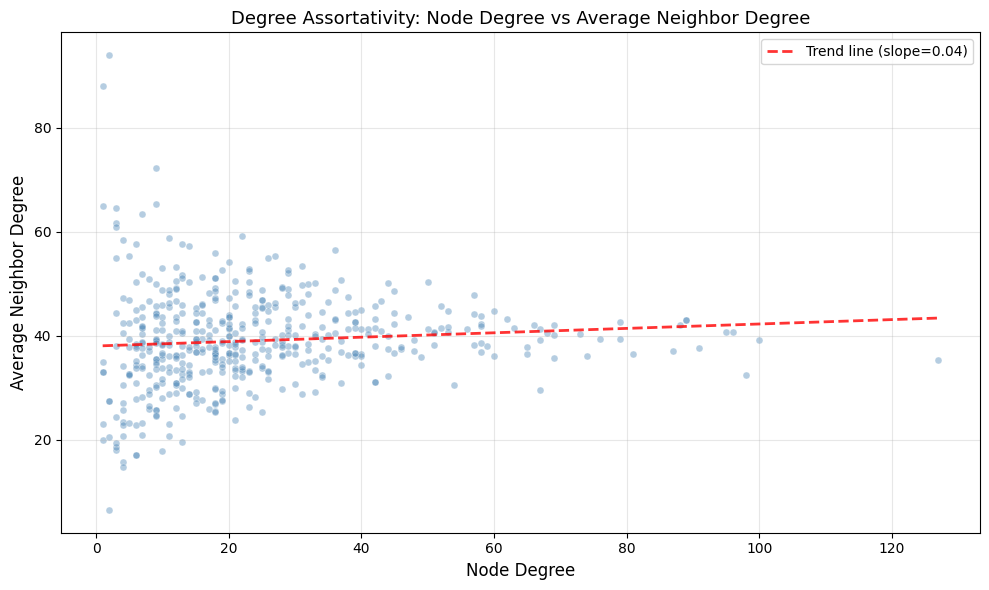

In [26]:
# 4. ASSORTATIVITY ANALYSIS

# Degree assortativity coefficient
degree_assortativity = nx.degree_assortativity_coefficient(G)
print(f"Degree Assortativity Coefficient: {degree_assortativity:.4f}")

# Visualize degree assortativity: node degree vs average neighbor degree
neighbors_avg_degree = {}
for node in G.nodes():
    neighbors = list(G.neighbors(node))
    if neighbors:
        avg_neighbor_degree = np.mean([G.degree(n) for n in neighbors])
        neighbors_avg_degree[node] = avg_neighbor_degree

node_degrees = [G.degree(n) for n in neighbors_avg_degree.keys()]
neighbor_degrees = [neighbors_avg_degree[n] for n in neighbors_avg_degree.keys()]

plt.figure(figsize=(10, 6))
plt.scatter(node_degrees, neighbor_degrees, alpha=0.4, s=25, color='steelblue', edgecolor='white', linewidth=0.5)
plt.xlabel('Node Degree', fontsize=12)
plt.ylabel('Average Neighbor Degree', fontsize=12)
plt.title('Degree Assortativity: Node Degree vs Average Neighbor Degree', fontsize=13)
plt.grid(True, alpha=0.3)

# Add trend line
z = np.polyfit(node_degrees, neighbor_degrees, 1)
p = np.poly1d(z)
plt.plot(sorted(node_degrees), p(sorted(node_degrees)), "r--", alpha=0.8, linewidth=2, 
         label=f'Trend line (slope={z[0]:.2f})')
plt.legend()
plt.tight_layout()
plt.show()

Computing ForceAtlas2 layout for 486 nodes...


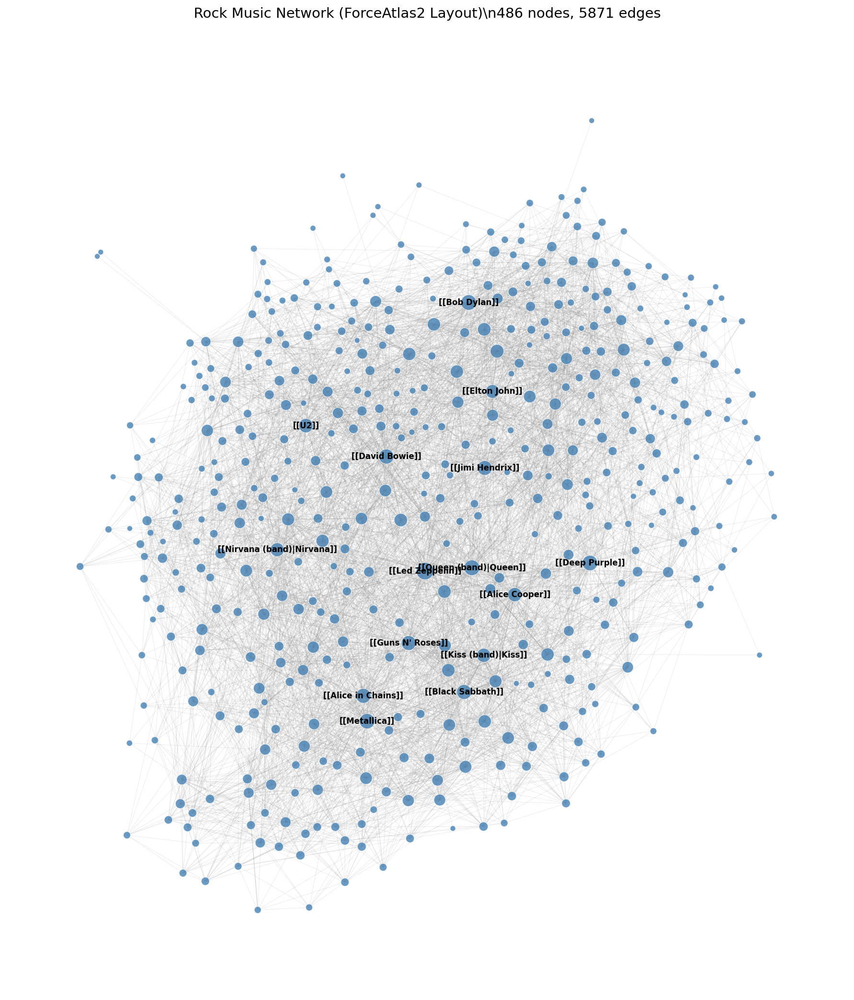

In [27]:
# 5. FORCEATLAS2 VISUALIZATION

# Helper function to use ForceAtlas2 (tries NetworkX, falls back to fa2 package)
def nx_forceatlas2_layout_if_available(G, seed=None, **params):
    """Try NetworkX's forceatlas2_layout, fall back to fa2 package if unavailable."""
    fa2_fn = getattr(nx, "forceatlas2_layout", None)
    
    if fa2_fn is not None:
        # Use NetworkX implementation
        nx_kwargs = dict(
            max_iter=params.get("max_iter", 800),
            jitter_tolerance=params.get("jitter_tolerance", 1.0),
            scaling_ratio=params.get("scaling_ratio", 2.0),
            gravity=params.get("gravity", 1.0),
            distributed_action=params.get("distributed_action", False),
            strong_gravity=params.get("strong_gravity", False),
            dissuade_hubs=params.get("dissuade_hubs", False),
            linlog=params.get("linlog", False),
            seed=seed,
        )
        return fa2_fn(G, **nx_kwargs)
    
    # Fall back to fa2 package
    try:
        from fa2 import ForceAtlas2
    except ImportError:
        raise ImportError(
            "NetworkX forceatlas2_layout not found and 'fa2' is not installed. "
            "Install with: pip install fa2"
        )
    
    fa2 = ForceAtlas2(
        outboundAttractionDistribution=params.get("distributed_action", False),
        linLogMode=params.get("linlog", False),
        adjustSizes=False,
        edgeWeightInfluence=params.get("edge_weight_influence", 1.0),
        jitterTolerance=params.get("jitter_tolerance", 1.0),
        barnesHutOptimize=params.get("barnes_hut", True),
        barnesHutTheta=params.get("barnes_hut_theta", 1.2),
        scalingRatio=params.get("scaling_ratio", 2.0),
        strongGravityMode=params.get("strong_gravity", False),
        gravity=params.get("gravity", 1.0),
        verbose=False,
    )
    return fa2.forceatlas2_networkx_layout(G, pos=None, iterations=params.get("max_iter", 800))

# ForceAtlas2 parameters
FA2_PARAMS = dict(
    max_iter=800,
    gravity=1.0,
    scaling_ratio=2.0,
    strong_gravity=False,
    linlog=False,
    jitter_tolerance=1.0,
    distributed_action=False,
    dissuade_hubs=False,
    edge_weight_influence=1.0,
    barnes_hut=True,
    barnes_hut_theta=1.2,
)

# Compute layout
print(f"Computing ForceAtlas2 layout for {G.number_of_nodes()} nodes...")
pos = nx_forceatlas2_layout_if_available(G, seed=42, **FA2_PARAMS)

# Prepare node sizes (based on degree in backbone)
degrees = np.array([G.degree(n) for n in G.nodes()], dtype=float)
if degrees.max() > degrees.min():
    deg_norm = (degrees - degrees.min()) / (degrees.max() - degrees.min())
else:
    deg_norm = np.zeros_like(degrees)

DEGREE_SIZE_MIN, DEGREE_SIZE_MAX = 30, 300
node_sizes = DEGREE_SIZE_MIN + deg_norm * (DEGREE_SIZE_MAX - DEGREE_SIZE_MIN)

# Draw the network
plt.figure(figsize=(14, 14), dpi=150)
ax = plt.gca()
ax.set_aspect("equal")

# Draw edges (light and thin)
nx.draw_networkx_edges(
    G, pos,
    alpha=0.15,
    width=0.5,
    edge_color="gray"
)

# Draw nodes (sized by degree)
nx.draw_networkx_nodes(
    G, pos,
    node_size=node_sizes,
    node_color='steelblue',
    alpha=0.8,
    linewidths=0.5,
    edgecolors='white'
)

# Add labels for top 15 nodes by degree
top_nodes = sorted(G.degree(), key=lambda x: x[1], reverse=True)[:15]
labels = {node: node for node, _ in top_nodes}
nx.draw_networkx_labels(G, pos, labels, font_size=8, font_weight='bold')

plt.axis("off")
plt.title(f"Rock Music Network (ForceAtlas2 Layout)\\n{G.number_of_nodes()} nodes, {G.number_of_edges()} edges", 
          fontsize=14, pad=20)
plt.tight_layout()
plt.show()

### Written Analysis
TODO

- Number of nodes: 486
- Number of edges: 5871
- Network density: 0.049815
- Average clustering coefficient: 0.2374

- Max degree: 127
- Min degree: 1
- Degree dist
- top 10 connected artists

- top 10 degree centrality
- top 10 betweenness centrality
- top 10 eigenvector centrality

- assortativity (none here)

- graph

## Part 2

### Generes and Modularity
TODO

In [28]:
# Import necessary libraries
import pandas as pd
import re
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import numpy as np

# Load the Wikipedia pages data
df = pd.read_csv('wikipages.csv')
print(f"Loaded {len(df)} Wikipedia pages")
df.head()

Loaded 488 Wikipedia pages


,id,title,wikiarticle,words
0,1,[[10cc]],{{short description|English art rock band}}\n{...,10150
1,2,[[10 Years (band)|10 Years]],{{short description|American alternative metal...,3723
2,3,[[3 Doors Down]],{{short description|American rock band}}\n{{ab...,6690
3,4,[[311 (band)|311]],{{short description|American rock band}}\n{{ab...,7514
4,5,[[38 Special (band)|.38 Special]],{{Short description|American rock band}}\n{{Us...,3834


In [29]:
def extract_genre_from_infobox(wiki_text):
    """
    Extract genres from Wikipedia infobox.
    Returns a list of genres (empty list if none found).
    """
    if pd.isna(wiki_text):
        return []
    
    genres = []
    
    # Look for the genre field in the infobox
    # This pattern captures multiline genre fields
    genre_pattern = r'\|\s*genres?\s*=\s*(.+?)(?=\n\||\n\}\}|$)'
    
    matches = re.findall(genre_pattern, wiki_text, re.IGNORECASE | re.DOTALL)
    
    for match in matches:
        genre_text = match.strip()
        
        # Remove HTML/XML references first
        genre_text = re.sub(r'<ref[^>]*>.*?</ref>', '', genre_text, flags=re.DOTALL)
        genre_text = re.sub(r'<ref[^>]*\s*/>', '', genre_text)
        
        # Remove comments
        genre_text = re.sub(r'<!---.*?--->', '', genre_text, flags=re.DOTALL)
        
        # Extract content from {{hlist|...}} and {{flatlist|...}} templates
        # These templates are used to format lists in Wikipedia
        if '{{hlist' in genre_text.lower() or '{{flatlist' in genre_text.lower():
            # Extract content between the template braces
            template_content = re.search(r'\{\{(?:hlist|flatlist)\|(.*)\}\}', genre_text, re.IGNORECASE | re.DOTALL)
            if template_content:
                genre_text = template_content.group(1)
        
        # Now extract all wiki links [[Genre Name]] or [[Genre|Display]]
        wiki_links = re.findall(r'\[\[([^\]|]+)(?:\|[^\]]+)?\]\]', genre_text)
        
        for link in wiki_links:
            # Clean up the genre name
            clean_genre = link.strip()
            # Remove things like "music" suffix to normalize
            # e.g., "Rock music" -> keep as is, we'll handle later
            if clean_genre and len(clean_genre) < 50:
                genres.append(clean_genre.lower())
        
        # Also handle plain text genres (without wiki links)
        # Remove all wiki markup first
        plain_text = re.sub(r'\{\{[^}]+\}\}', '', genre_text)
        plain_text = re.sub(r'\[\[[^\]]+\]\]', '', plain_text)
        plain_text = re.sub(r'<[^>]+>', '', plain_text)
        plain_text = re.sub(r"'''", '', plain_text)
        plain_text = re.sub(r"''", '', plain_text)
        plain_text = re.sub(r'&nbsp;', ' ', plain_text)
        
        # Split by common delimiters
        parts = re.split(r'[|\n•,]', plain_text)
        for part in parts:
            part = part.strip()
            # Only add if it looks like a genre (not empty, not too long, contains letters)
            if part and 2 < len(part) < 50 and re.search(r'[a-zA-Z]', part):
                # Skip if it's clearly not a genre
                if not any(skip in part.lower() for skip in ['http', 'www', 'cite', 'ref', '{{', '}}', '[[', ']]']):
                    genres.append(part.lower())
    
    # Normalize genre names
    normalized_genres = []
    for genre in genres:
        # Clean up common patterns
        genre = re.sub(r"rock['\s]?n['\s]?roll", "rock and roll", genre)
        genre = re.sub(r"rock\s*&\s*roll", "rock and roll", genre)
        genre = re.sub(r'\s+', ' ', genre).strip()
        
        # Remove "music" suffix for normalization
        # e.g., "rock music" -> "rock"
        genre = re.sub(r'\s+music$', '', genre)
        
        if genre and len(genre) > 1:
            normalized_genres.append(genre)
    
    # Remove duplicates while preserving order
    seen = set()
    unique_genres = []
    for g in normalized_genres:
        if g not in seen and g:
            seen.add(g)
            unique_genres.append(g)
    
    return unique_genres

# Test on a few examples
print("Testing genre extraction:")
print("\nExample 1 (row 0):")
result1 = extract_genre_from_infobox(df.iloc[0]['wikiarticle'])
print(result1)

print("\nExample 2 (row 1):")
if len(df) > 1:
    result2 = extract_genre_from_infobox(df.iloc[1]['wikiarticle'])
    print(result2)
    
print("\nExample 3 (row 2):")
if len(df) > 2:
    result3 = extract_genre_from_infobox(df.iloc[2]['wikiarticle'])
    print(result3)

Testing genre extraction:

Example 1 (row 0):
['art rock', 'art pop', 'progressive pop', 'soft rock', 'pop rock']

Example 2 (row 1):
['alternative metal', 'progressive metal', 'post-grunge', 'nu&nbsp;metal']

Example 3 (row 2):
['post-grunge', 'alternative rock']


In [30]:
# Extract genres for all artists
print("Extracting genres for all artists...")
artist_genres = {}

for idx, row in df.iterrows():
    artist_name = row['title'].strip('[]')  # Remove [[ ]] from title
    genres = extract_genre_from_infobox(row['wikiarticle'])
    
    if genres:  # Only add if we found at least one genre
        artist_genres[artist_name] = genres

print(f"\nExtraction complete!")
print(f"Total artists in dataset: {len(df)}")
print(f"Artists with genres: {len(artist_genres)}")
print(f"\nSample of extracted genres:")
for i, (artist, genres) in enumerate(list(artist_genres.items())[:10]):
    print(f"{artist}: {genres}")

Extracting genres for all artists...

Extraction complete!
Total artists in dataset: 488
Artists with genres: 487

Sample of extracted genres:
10cc: ['art rock', 'art pop', 'progressive pop', 'soft rock', 'pop rock']
10 Years (band)|10 Years: ['alternative metal', 'progressive metal', 'post-grunge', 'nu&nbsp;metal']
3 Doors Down: ['post-grunge', 'alternative rock']
311 (band)|311: ['alternative rock', 'rap rock', 'reggae rock', 'funk rock', 'funk metal']
38 Special (band)|.38 Special: ['hard rock', 'southern rock', 'boogie rock', 'blues rock']
ABBA: ['pop', 'disco', 'pop rock', 'europop']
Accept (band)|Accept: ['heavy metal']
AC/DC: ['hard rock', 'blues rock', 'rock and roll', 'heavy metal']
Bryan Adams: ['rock', 'pop rock', 'soft rock', 'arena rock', 'heartland rock']
Aerosmith: ['hard rock', 'blues rock', 'heavy metal']


In [31]:
# Calculate statistics
num_artists_with_genres = len(artist_genres)
total_genre_count = sum(len(genres) for genres in artist_genres.values())
avg_genres_per_artist = total_genre_count / num_artists_with_genres if num_artists_with_genres > 0 else 0

# Count all unique genres
all_genres = []
for genres in artist_genres.values():
    all_genres.extend(genres)

genre_counts = Counter(all_genres)
num_distinct_genres = len(genre_counts)

print("=" * 60)
print("GENRE STATISTICS")
print("=" * 60)
print(f"Number of artists with genres: {num_artists_with_genres}")
print(f"Average number of genres per artist: {avg_genres_per_artist:.2f}")
print(f"Total number of distinct genres: {num_distinct_genres}")
print("\nTop 15 most common genres:")
for i, (genre, count) in enumerate(genre_counts.most_common(15), 1):
    print(f"{i:2d}. {genre:30s} - {count:4d} artists")

GENRE STATISTICS
Number of artists with genres: 487
Average number of genres per artist: 3.82
Total number of distinct genres: 244

Top 15 most common genres:
 1. hard rock                      -  141 artists
 2. alternative rock               -  136 artists
 3. pop rock                       -   99 artists
 4. rock                           -   83 artists
 5. blues rock                     -   54 artists
 6. heavy metal                    -   52 artists
 7. alternative metal              -   51 artists
 8. pop                            -   49 artists
 9. soft rock                      -   44 artists
10. post-grunge                    -   40 artists
11. indie rock                     -   36 artists
12. folk rock                      -   35 artists
13. progressive rock               -   33 artists
14. new wave                       -   33 artists
15. art rock                       -   29 artists


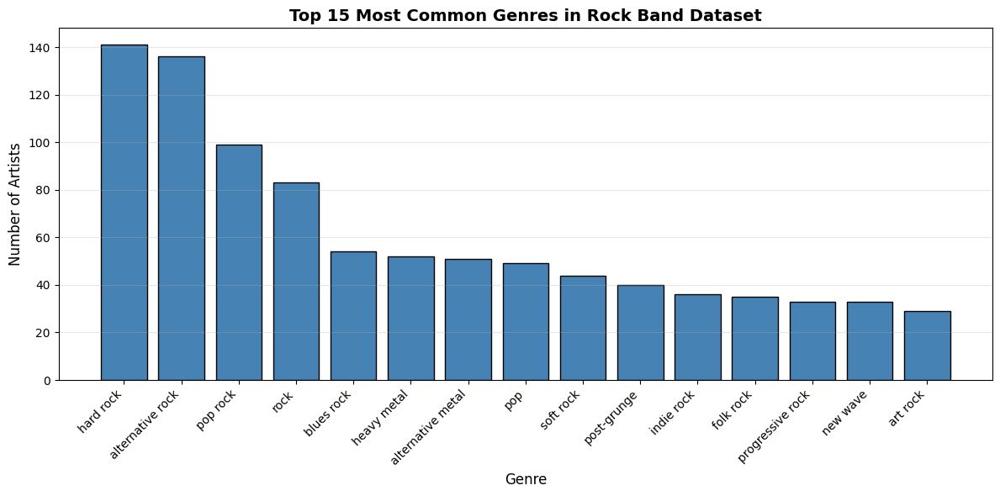


The histogram shows the distribution of the top 15 genres among 487 artists.


In [32]:
# Create histogram for top 15 genres
top_15_genres = genre_counts.most_common(15)
genres_list = [g[0] for g in top_15_genres]
counts_list = [g[1] for g in top_15_genres]

plt.figure(figsize=(12, 6))
plt.bar(range(len(genres_list)), counts_list, color='steelblue', edgecolor='black')
plt.xlabel('Genre', fontsize=12)
plt.ylabel('Number of Artists', fontsize=12)
plt.title('Top 15 Most Common Genres in Rock Band Dataset', fontsize=14, fontweight='bold')
plt.xticks(range(len(genres_list)), genres_list, rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print(f"\nThe histogram shows the distribution of the top 15 genres among {num_artists_with_genres} artists.")

### Genres and Modularity

**What is Modularity?**

Modularity is a metric that measures how well a network is divided into communities or modules. It quantifies the quality of a partition by comparing the actual density of edges within communities to what we would expect if edges were placed randomly while preserving the degree distribution.

The modularity score M ranges from -1 to 1:
- **M > 0**: More edges within communities than expected by chance (good community structure)
- **M ≈ 0**: Communities are no better than random
- **M < 0**: Fewer edges within communities than expected (poor partition)

**Formula (Equation 9.12 from Network Science book):**

$$M = \frac{1}{2m} \sum_{i,j} \left[ A_{ij} - \frac{k_i k_j}{2m} \right] \delta(c_i, c_j)$$

Where:
- $m$ = total number of edges
- $A_{ij}$ = adjacency matrix (1 if edge exists, 0 otherwise)
- $k_i, k_j$ = degrees of nodes i and j
- $c_i, c_j$ = community labels of nodes i and j
- $\delta(c_i, c_j)$ = 1 if $c_i = c_j$, else 0

**Intuition:** Modularity compares the fraction of edges within communities to the expected fraction if edges were randomly distributed. High modularity means the network has strong community structure where nodes within the same community are densely connected.

**Applying to Genres:**

We can treat music genres as community labels and calculate the modularity of the network when partitioned by genres. This tells us: *Do artists of the same genre tend to be connected to each other more than we'd expect by chance?* If genres have high modularity, it suggests that musical genres correspond to structural communities in the network.

In [33]:
# Step 1: Create subgraph with only nodes that have genre information
# Map artist names from genre dict to network node names
genre_nodes = []
node_to_genres = {}  # Maps node name to list of genres

for node in G.nodes():
    # Try to match node name with artist_genres keys
    clean_node = node.strip('[]')
    
    if node in artist_genres:
        genre_nodes.append(node)
        node_to_genres[node] = artist_genres[node]
    elif clean_node in artist_genres:
        genre_nodes.append(node)
        node_to_genres[node] = artist_genres[clean_node]

# Create subgraph with only nodes that have genres
G_genre = G.subgraph(genre_nodes).copy()

print(f"Original network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")
print(f"Genre subnetwork: {G_genre.number_of_nodes()} nodes, {G_genre.number_of_edges()} edges")
print(f"Percentage of nodes with genre info: {100*G_genre.number_of_nodes()/G.number_of_nodes():.1f}%")

Original network: 486 nodes, 5871 edges
Genre subnetwork: 485 nodes, 5854 edges
Percentage of nodes with genre info: 99.8%


In [34]:
# Step 2: Detect communities using Louvain algorithm
from networkx.algorithms import community

print("Detecting communities using Louvain algorithm...")
communities = community.louvain_communities(G_genre, seed=42)

# Create node to community mapping
node_to_community = {}
for comm_idx, comm in enumerate(communities):
    for node in comm:
        node_to_community[node] = comm_idx

print(f"\nNumber of communities detected: {len(communities)}")
print(f"\nCommunity sizes:")
comm_sizes = [(i, len(comm)) for i, comm in enumerate(communities)]
comm_sizes.sort(key=lambda x: x[1], reverse=True)
for i, (comm_idx, size) in enumerate(comm_sizes[:10]):
    print(f"  Community {comm_idx}: {size} nodes")

Detecting communities using Louvain algorithm...

Number of communities detected: 6

Community sizes:
  Community 1: 153 nodes
  Community 4: 109 nodes
  Community 3: 89 nodes
  Community 5: 83 nodes
  Community 2: 48 nodes
  Community 0: 3 nodes


In [35]:
# Step 3: Build the confusion matrix D
# D[i,j] = number of nodes that have genre i and are in community j

# Get top 7 genres
top_7_genres = [genre for genre, count in genre_counts.most_common(7)]
print("Top 7 genres:")
for i, genre in enumerate(top_7_genres, 1):
    print(f"  {i}. {genre}")

# Get top 7 communities (by size)
top_7_communities = [comm_idx for comm_idx, size in comm_sizes[:7]]
print(f"\nTop 7 communities (by size): {top_7_communities}")

# Initialize confusion matrix
D = np.zeros((len(top_7_genres), len(top_7_communities)), dtype=int)

# Fill the confusion matrix
# Note: A node can have multiple genres, so it can contribute to multiple rows
for node in G_genre.nodes():
    if node not in node_to_community:
        continue
    
    node_comm = node_to_community[node]
    
    # Check if this node's community is in top 7
    if node_comm not in top_7_communities:
        continue
    
    comm_col_idx = top_7_communities.index(node_comm)
    
    # Check all genres this node has
    if node in node_to_genres:
        node_genres_list = node_to_genres[node]
        
        # For each genre this node has
        for genre in node_genres_list:
            if genre in top_7_genres:
                genre_row_idx = top_7_genres.index(genre)
                D[genre_row_idx, comm_col_idx] += 1

print("\nConfusion Matrix D (Genres vs Communities):")
print("=" * 70)
print(f"{'Genre':<25} | " + " ".join([f"C{c:<5}" for c in top_7_communities]))
print("-" * 70)
for i, genre in enumerate(top_7_genres):
    row_str = f"{genre:<25} | " + " ".join([f"{D[i,j]:<6}" for j in range(len(top_7_communities))])
    print(row_str)

Top 7 genres:
  1. hard rock
  2. alternative rock
  3. pop rock
  4. rock
  5. blues rock
  6. heavy metal
  7. alternative metal

Top 7 communities (by size): [1, 4, 3, 5, 2, 0]

Confusion Matrix D (Genres vs Communities):
Genre                     | C1     C4     C3     C5     C2     C0    
----------------------------------------------------------------------
hard rock                 | 17     69     13     7      35     0     
alternative rock          | 3      4      53     47     29     0     
pop rock                  | 36     13     21     22     6      0     
rock                      | 59     11     2      10     1      0     
blues rock                | 25     23     2      2      2      0     
heavy metal               | 2      41     5      0      4      0     
alternative metal         | 0      11     20     0      20     0     


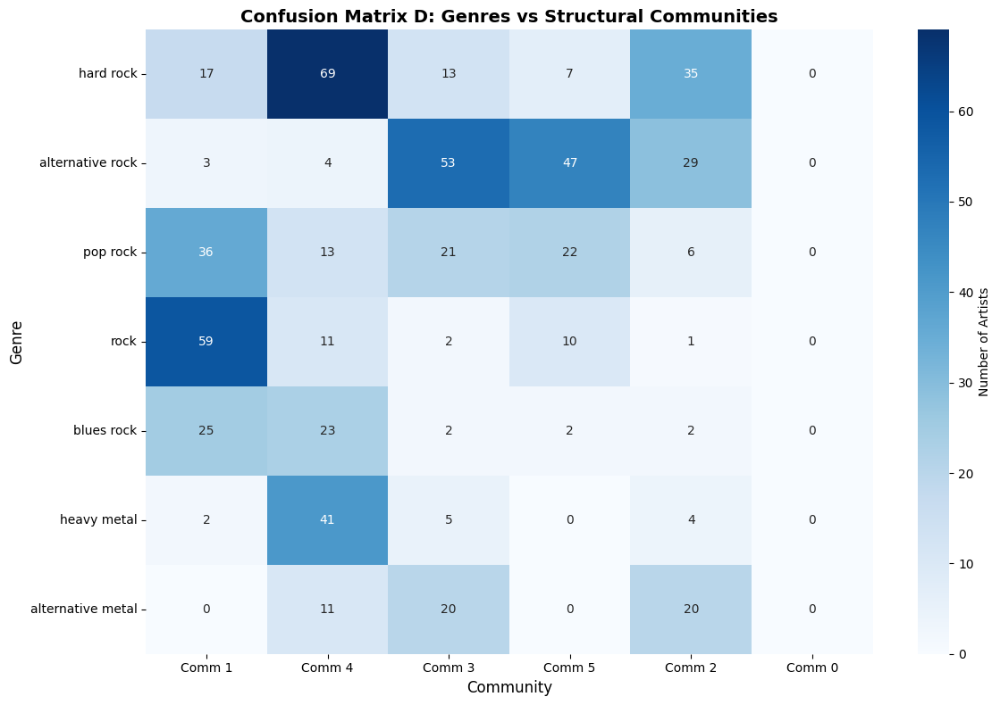


Analysis of Confusion Matrix:
hard rock                : 69/141 (48.9%) in Community 4
alternative rock         : 53/136 (39.0%) in Community 3
pop rock                 : 36/98 (36.7%) in Community 1
rock                     : 59/83 (71.1%) in Community 1
blues rock               : 25/54 (46.3%) in Community 1
heavy metal              : 41/52 (78.8%) in Community 4
alternative metal        : 20/51 (39.2%) in Community 3


Dominant genre per community:
Community 1  : rock                      (59/142 = 41.5%)
Community 4  : hard rock                 (69/172 = 40.1%)
Community 3  : alternative rock          (53/116 = 45.7%)
Community 5  : alternative rock          (47/88 = 53.4%)
Community 2  : hard rock                 (35/97 = 36.1%)
Community 0  : hard rock                 (0/0 = 0.0%)


In [36]:
# Step 4: Visualize the confusion matrix as a heatmap
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(D, annot=True, fmt='d', cmap='Blues', 
            xticklabels=[f"Comm {c}" for c in top_7_communities],
            yticklabels=top_7_genres,
            cbar_kws={'label': 'Number of Artists'})
plt.xlabel('Community', fontsize=12)
plt.ylabel('Genre', fontsize=12)
plt.title('Confusion Matrix D: Genres vs Structural Communities', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Calculate some statistics
print("\nAnalysis of Confusion Matrix:")
print("=" * 70)

# For each genre, find the dominant community
for i, genre in enumerate(top_7_genres):
    max_comm_idx = np.argmax(D[i, :])
    max_count = D[i, max_comm_idx]
    total_count = np.sum(D[i, :])
    percentage = 100 * max_count / total_count if total_count > 0 else 0
    print(f"{genre:<25}: {max_count}/{total_count} ({percentage:.1f}%) in Community {top_7_communities[max_comm_idx]}")

print("\n" + "=" * 70)
# For each community, find the dominant genre
print("\nDominant genre per community:")
for j, comm_idx in enumerate(top_7_communities):
    max_genre_idx = np.argmax(D[:, j])
    max_count = D[max_genre_idx, j]
    total_count = np.sum(D[:, j])
    percentage = 100 * max_count / total_count if total_count > 0 else 0
    print(f"Community {comm_idx:<3}: {top_7_genres[max_genre_idx]:<25} ({max_count}/{total_count} = {percentage:.1f}%)")

communities dont align with genres

### Network Visualization: Communities and Genres

Now let's visualize the network to see how the detected communities and genres are distributed spatially. We'll create two visualizations:
1. Network colored by structural communities (detected by Louvain)
2. Network colored by genres (using first genre for each artist)

In [37]:
# Compute ForceAtlas2 layout for genre subgraph
print(f"Computing ForceAtlas2 layout for genre subgraph ({G_genre.number_of_nodes()} nodes)...")
pos_genre = nx_forceatlas2_layout_if_available(G_genre, seed=42, **FA2_PARAMS)

# Prepare node sizes based on degree
degrees_genre = np.array([G_genre.degree(n) for n in G_genre.nodes()], dtype=float)
if degrees_genre.max() > degrees_genre.min():
    deg_norm = (degrees_genre - degrees_genre.min()) / (degrees_genre.max() - degrees_genre.min())
else:
    deg_norm = np.zeros_like(degrees_genre)

node_sizes_genre = 30 + deg_norm * 200

print("Layout computed successfully!")

Computing ForceAtlas2 layout for genre subgraph (485 nodes)...
Layout computed successfully!


/var/folders/h2/yl2gtgcs0010p0b86w781xsc0000gn/T/ipykernel_56057/3446173935.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors_comm = cm.get_cmap('tab10', len(top_7_communities))


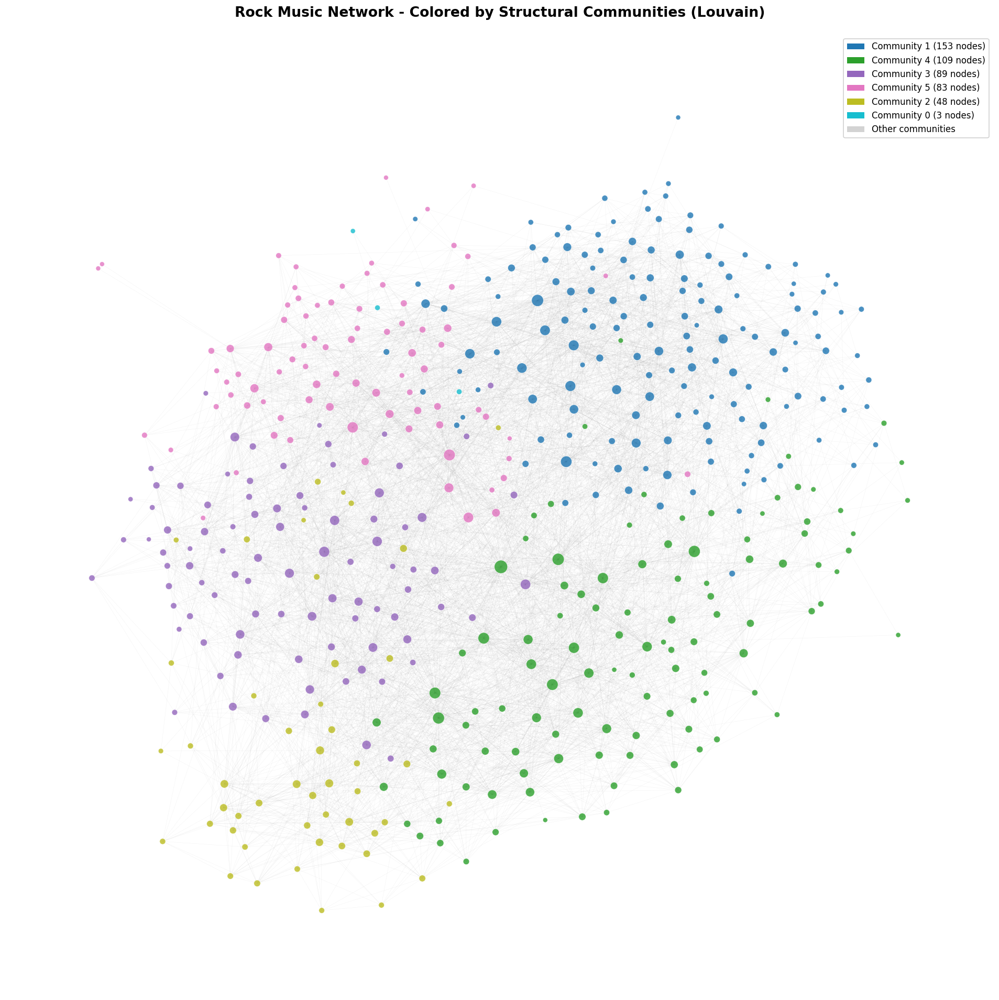

Visualization shows 6 communities (highlighting top 7 largest)


In [38]:
# Visualization 1: Network colored by COMMUNITIES
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Get the 7 largest communities
top_7_comm_set = set(top_7_communities)

# Create color map for communities
# Use a colormap with distinct colors
colors_comm = cm.get_cmap('tab10', len(top_7_communities))
community_colors = {}
for idx, comm_id in enumerate(top_7_communities):
    community_colors[comm_id] = colors_comm(idx)

# Assign colors to nodes
node_colors_by_comm = []
for node in G_genre.nodes():
    comm = node_to_community[node]
    if comm in top_7_comm_set:
        node_colors_by_comm.append(community_colors[comm])
    else:
        # Nodes in smaller communities get gray color
        node_colors_by_comm.append('lightgray')

# Plot
fig, ax = plt.subplots(figsize=(16, 16), dpi=120)

# Draw edges
nx.draw_networkx_edges(
    G_genre, pos_genre,
    alpha=0.1,
    width=0.3,
    edge_color='gray',
    ax=ax
)

# Draw nodes
nx.draw_networkx_nodes(
    G_genre, pos_genre,
    node_size=node_sizes_genre,
    node_color=node_colors_by_comm,
    alpha=0.8,
    linewidths=0.5,
    edgecolors='white',
    ax=ax
)

# Create legend
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=community_colors[comm], label=f'Community {comm} ({comm_sizes[idx][1]} nodes)')
                   for idx, (comm, size) in enumerate(comm_sizes[:7])]
legend_elements.append(Patch(facecolor='lightgray', label='Other communities'))

ax.legend(handles=legend_elements, loc='upper right', fontsize=10, framealpha=0.9)
ax.set_title('Rock Music Network - Colored by Structural Communities (Louvain)', 
             fontsize=16, fontweight='bold', pad=20)
ax.axis('off')
plt.tight_layout()
plt.show()

print(f"Visualization shows {len(communities)} communities (highlighting top 7 largest)")

/var/folders/h2/yl2gtgcs0010p0b86w781xsc0000gn/T/ipykernel_56057/1522521696.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors_genre = cm.get_cmap('Set3', len(top_7_genres))


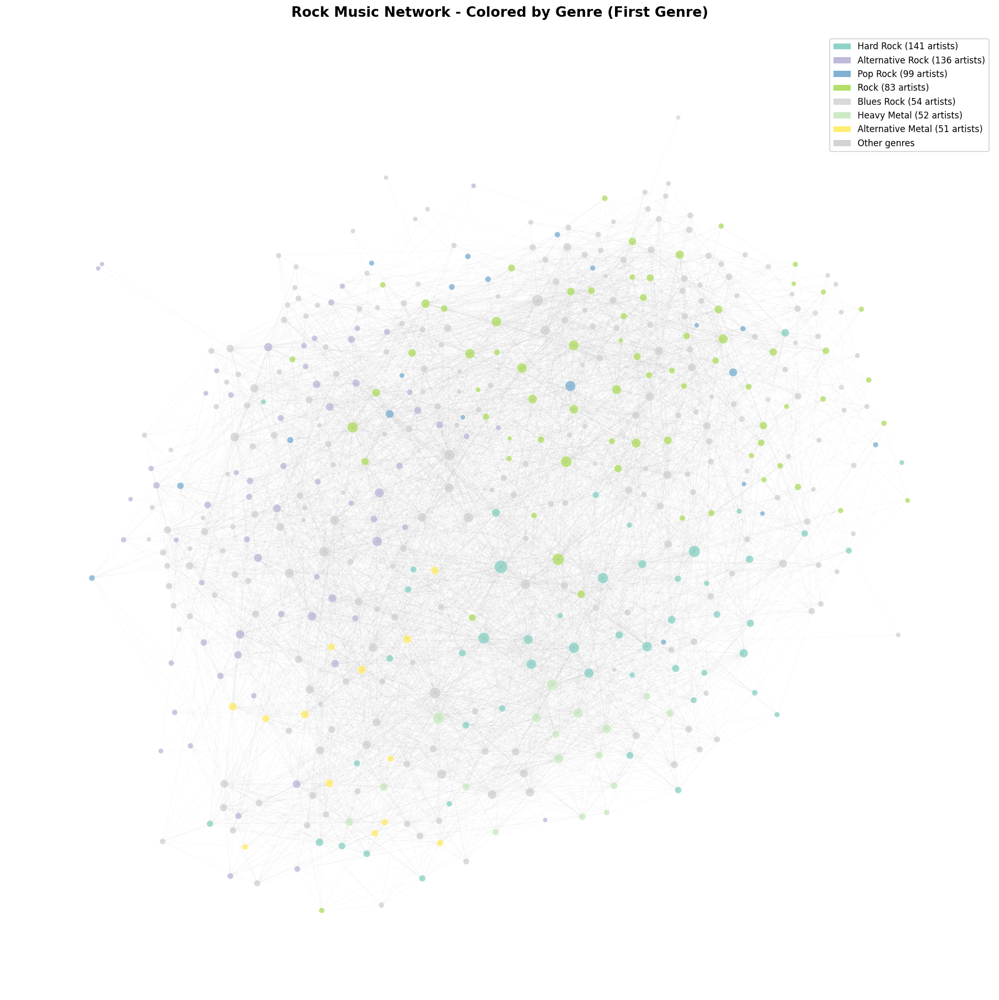

Visualization shows distribution of top 7 genres across the network


In [39]:
# Visualization 2: Network colored by GENRES (using first genre)

# Create a mapping of node to its first genre
node_to_first_genre = {}
for node in G_genre.nodes():
    if node in node_to_genres and len(node_to_genres[node]) > 0:
        node_to_first_genre[node] = node_to_genres[node][0]
    else:
        node_to_first_genre[node] = 'unknown'

# Get top 7 genres
top_7_genres_set = set(top_7_genres)

# Create color map for genres
colors_genre = cm.get_cmap('Set3', len(top_7_genres))
genre_colors = {}
for idx, genre in enumerate(top_7_genres):
    genre_colors[genre] = colors_genre(idx)

# Assign colors to nodes based on first genre
node_colors_by_genre = []
for node in G_genre.nodes():
    first_genre = node_to_first_genre[node]
    if first_genre in top_7_genres_set:
        node_colors_by_genre.append(genre_colors[first_genre])
    else:
        # Nodes with genres outside top 7 get gray
        node_colors_by_genre.append('lightgray')

# Plot
fig, ax = plt.subplots(figsize=(16, 16), dpi=120)

# Draw edges
nx.draw_networkx_edges(
    G_genre, pos_genre,
    alpha=0.1,
    width=0.3,
    edge_color='gray',
    ax=ax
)

# Draw nodes
nx.draw_networkx_nodes(
    G_genre, pos_genre,
    node_size=node_sizes_genre,
    node_color=node_colors_by_genre,
    alpha=0.8,
    linewidths=0.5,
    edgecolors='white',
    ax=ax
)

# Create legend
legend_elements = [Patch(facecolor=genre_colors[genre], label=f'{genre.title()} ({genre_counts[genre]} artists)')
                   for genre in top_7_genres]
legend_elements.append(Patch(facecolor='lightgray', label='Other genres'))

ax.legend(handles=legend_elements, loc='upper right', fontsize=10, framealpha=0.9)
ax.set_title('Rock Music Network - Colored by Genre (First Genre)', 
             fontsize=16, fontweight='bold', pad=20)
ax.axis('off')
plt.tight_layout()
plt.show()

print(f"Visualization shows distribution of top 7 genres across the network")

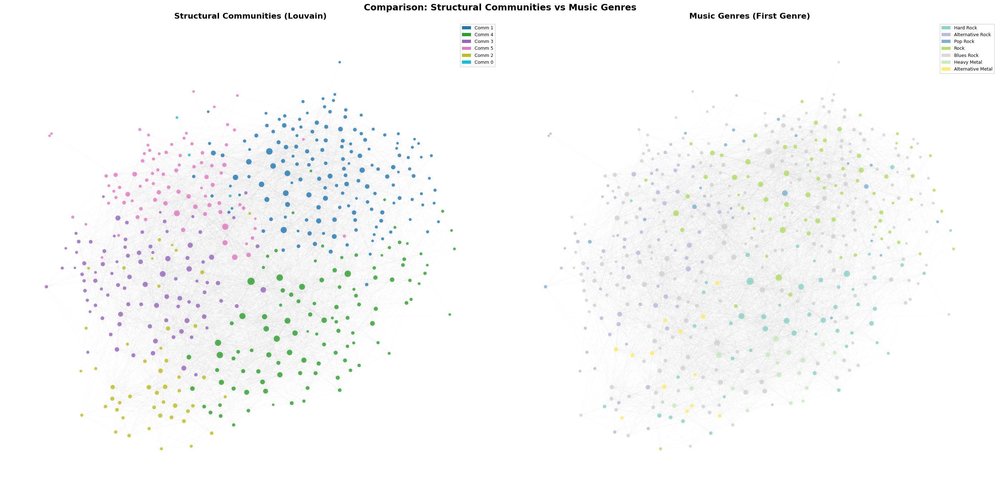

In [40]:
# Visualization 3: Side-by-side comparison
fig, axes = plt.subplots(1, 2, figsize=(28, 14), dpi=100)

# Left plot: Communities
ax1 = axes[0]
nx.draw_networkx_edges(G_genre, pos_genre, alpha=0.08, width=0.3, edge_color='gray', ax=ax1)
nx.draw_networkx_nodes(G_genre, pos_genre, node_size=node_sizes_genre, 
                       node_color=node_colors_by_comm, alpha=0.8, 
                       linewidths=0.5, edgecolors='white', ax=ax1)
ax1.set_title('Structural Communities (Louvain)', fontsize=16, fontweight='bold')
ax1.axis('off')

# Legend for communities
legend1 = [Patch(facecolor=community_colors[comm], label=f'Comm {comm}')
           for comm in top_7_communities]
ax1.legend(handles=legend1, loc='upper right', fontsize=9, framealpha=0.9)

# Right plot: Genres
ax2 = axes[1]
nx.draw_networkx_edges(G_genre, pos_genre, alpha=0.08, width=0.3, edge_color='gray', ax=ax2)
nx.draw_networkx_nodes(G_genre, pos_genre, node_size=node_sizes_genre, 
                       node_color=node_colors_by_genre, alpha=0.8,
                       linewidths=0.5, edgecolors='white', ax=ax2)
ax2.set_title('Music Genres (First Genre)', fontsize=16, fontweight='bold')
ax2.axis('off')

# Legend for genres
legend2 = [Patch(facecolor=genre_colors[genre], label=genre.title())
           for genre in top_7_genres]
ax2.legend(handles=legend2, loc='upper right', fontsize=9, framealpha=0.9)

plt.suptitle('Comparison: Structural Communities vs Music Genres', 
             fontsize=18, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

### Observations and Comments on Visualizations

they dont look the same but you can see some alignment especially rock and comm1

## Part 3: TF-IDF to Understand Genres and Communities
TODO humanize

### What is TF-IDF?

**TF-IDF** (Term Frequency-Inverse Document Frequency) is a statistical measure used to evaluate how important a word is to a document in a collection of documents (corpus).

**Two Components:**

1. **Term Frequency (TF)**: How often a word appears in a document
   - High TF = word appears many times in this document
   - Formula: TF(word, doc) = count of word in doc / total words in doc

2. **Inverse Document Frequency (IDF)**: How rare/common a word is across all documents
   - High IDF = word appears in few documents (more distinctive)
   - Low IDF = word appears in many documents (common, less informative)
   - Formula: IDF(word) = log(total documents / documents containing word)

**TF-IDF Score = TF × IDF**

**Intuition:**
- Words that appear frequently in ONE document but rarely across ALL documents get high TF-IDF scores
- Common words like "the", "and", "is" appear in all documents → low IDF → low TF-IDF (automatically filtered out!)
- Distinctive words that characterize a specific document get high scores

**Why is this useful for genres and communities?**

- **For genres**: TF-IDF identifies words that are distinctively associated with each genre (e.g., "metal" for heavy metal, "blues" for blues rock)
- **For communities**: TF-IDF reveals words that characterize the structural communities, which might reveal thematic patterns not captured by genre labels
- **Comparison**: By comparing TF-IDF wordclouds for genres vs communities, we can see if structural communities have similar semantic themes to genres or if they represent different groupings

Let's calculate TF-IDF for both genres and communities and visualize them as wordclouds!

In [41]:
# Step 1: Text preprocessing with NLTK
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string

# Download required NLTK data
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize tools
stop_words = set(stopwords.words('english'))

def clean_text(text):
    """Clean and tokenize text."""
    if pd.isna(text):
        return []
    
    # Lowercase
    text = text.lower()
    
    # Remove wiki markup patterns
    text = re.sub(r'\{\{[^}]+\}\}', ' ', text)  # Remove templates
    text = re.sub(r'\[\[([^\]|]+)(\|[^\]]+)?\]\]', r'\1', text)  # Keep link text
    text = re.sub(r'<ref[^>]*>.*?</ref>', '', text, flags=re.DOTALL)  # Remove refs
    text = re.sub(r'<[^>]+>', '', text)  # Remove HTML tags
    text = re.sub(r"'''", '', text)  # Remove bold
    text = re.sub(r"''", '', text)  # Remove italic
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub(r'&\w+;', ' ', text)  # Remove HTML entities
    
    # Tokenize
    tokens = word_tokenize(text)
    
    # Remove punctuation and clean
    tokens = [re.sub(r'\W+', '', t) for t in tokens if re.sub(r'\W+', '', t)]
    
    # Remove stopwords and short words
    tokens = [
        t for t in tokens
        if t not in stop_words
        and len(t) > 2
        and not t.isdigit()
    ]
    
    return tokens

[nltk_data] Downloading package punkt_tab to /Users/jone/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/jone/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/jone/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [42]:
# Step 2: Create documents for each GENRE (using first genre)

# Map each artist to their first genre
artist_to_genre = {}
for node in G_genre.nodes():
    if node in node_to_genres and len(node_to_genres[node]) > 0:
        first_genre = node_to_genres[node][0]
        artist_to_genre[node] = first_genre

# Create a mapping from df titles to G_genre nodes for efficient lookup
df_title_to_node = {}
for node in G_genre.nodes():
    clean_node = node.strip('[]')
    df_title_to_node[clean_node] = node

# Create word count dictionaries for top 7 genres
genre_word_counts = {genre: Counter() for genre in top_7_genres}

for idx, row in df.iterrows():
    artist_name = row['title'].strip('[]')  # Remove [[ ]] from title
    
    # Look up the node directly using the mapping
    node_name = df_title_to_node.get(artist_name)
    
    if node_name and node_name in artist_to_genre:
        genre = artist_to_genre[node_name]
        if genre in top_7_genres:
            # Clean and tokenize the text
            tokens = clean_text(row['wikiarticle'])
            # Update word counts for this genre
            genre_word_counts[genre].update(tokens)

print("\nGenre word counts:")
for genre in top_7_genres:
    total_words = sum(genre_word_counts[genre].values())
    unique_words = len(genre_word_counts[genre])
    print(f"  {genre}: {total_words} total words, {unique_words} unique words")


Genre word counts:
  hard rock: 132603 total words, 14451 unique words
  alternative rock: 170187 total words, 17473 unique words
  pop rock: 56624 total words, 9165 unique words
  rock: 266022 total words, 23633 unique words
  blues rock: 19864 total words, 4834 unique words
  heavy metal: 61941 total words, 8956 unique words
  alternative metal: 31039 total words, 6001 unique words


In [43]:
# Step 3: Filter and prepare word frequencies for genres

# Words to exclude (common non-informative words)
exclude_words = {'cite', 'ref', 'urlhttps', 'album', 'band', 'name', 'web', 
                 'http', 'url', 'retrieved', 'wikipedia', 'category', 'file',
                 'image', 'thumb', 'px', 'left', 'right', 'center'}

genre_filtered_counts = {}

for genre in top_7_genres:
    # Filter: words that appear >= 5 times and not in exclude list
    filtered = {
        word: count
        for word, count in genre_word_counts[genre].items()
        if count >= 5 
        and word not in exclude_words
        and not any(ex in word for ex in ['http', 'url', 'www'])
    }
    
    genre_filtered_counts[genre] = filtered
    
    # Show top 10 words
    top_10 = Counter(filtered).most_common(10)
    print(f"{genre.upper()}:")
    print(f"  Total words (after filtering): {len(filtered)}")
    print("  Top 10 words:")
    for word, count in top_10:
        print(f"    {word}: {count}")
    print()

HARD ROCK:
  Total words (after filtering): 3754
  Top 10 words:
    tour: 1346
    rock: 1335
    released: 1017
    new: 854
    song: 797
    music: 778
    first: 634
    guitar: 566
    also: 562
    studio: 479

ALTERNATIVE ROCK:
  Total words (after filtering): 4522
  Top 10 words:
    released: 1717
    music: 1525
    song: 1524
    rock: 1301
    tour: 1249
    bar: 1185
    new: 942
    color: 848
    first: 847
    single: 782

POP ROCK:
  Total words (after filtering): 1921
  Top 10 words:
    music: 555
    john: 503
    released: 489
    song: 482
    bar: 427
    tour: 390
    color: 343
    vocals: 326
    new: 302
    first: 279

ROCK:
  Total words (after filtering): 6439
  Top 10 words:
    song: 2084
    music: 1947
    rock: 1622
    tour: 1520
    released: 1474
    first: 1244
    new: 1188
    guitar: 996
    american: 992
    one: 969

BLUES ROCK:
  Total words (after filtering): 778
  Top 10 words:
    released: 161
    blues: 157
    white: 140
    rock: 132

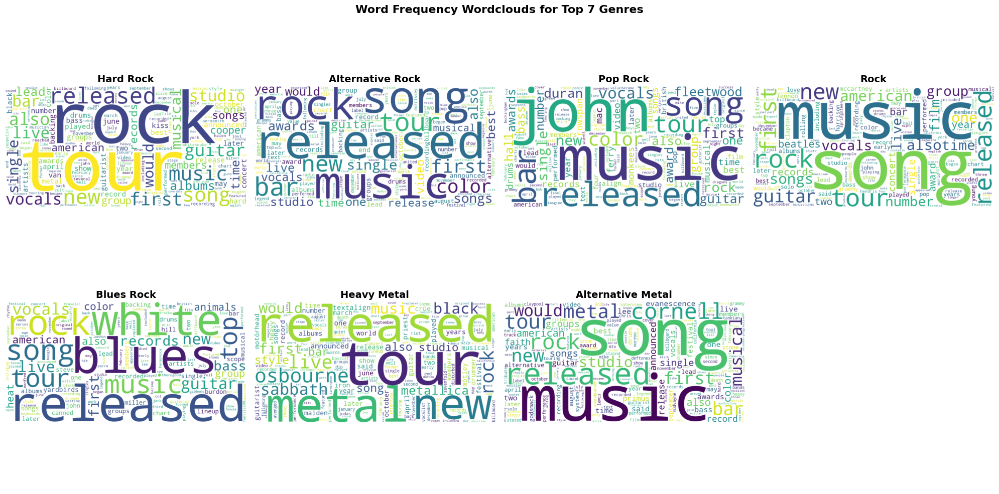

In [44]:
# Step 4: Create wordclouds for genres
from wordcloud import WordCloud

# Create wordclouds for each genre
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, genre in enumerate(top_7_genres):
    # Create WordCloud from frequencies
    wc = WordCloud(width=800, height=400, 
                   background_color='white',
                   colormap='viridis',
                   relative_scaling=0.5,
                   min_font_size=8)
    
    wc.generate_from_frequencies(genre_filtered_counts[genre])
    
    axes[idx].imshow(wc, interpolation='bilinear')
    axes[idx].set_title(f'{genre.title()}', fontsize=14, fontweight='bold')
    axes[idx].axis('off')

# Remove empty subplot
axes[7].axis('off')

plt.suptitle('Word Frequency Wordclouds for Top 7 Genres', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

In [45]:
# Step 5: Create word counts for each COMMUNITY

# Create word count dictionaries for communities
community_word_counts = {comm: Counter() for comm in top_7_communities}

for idx, row in df.iterrows():
    artist_name = row['title'].strip('[]')  # Remove [[ ]] from title
    
    # Look up the node directly using the mapping from before
    node_name = df_title_to_node.get(artist_name)
    
    if node_name and node_name in node_to_community:
        comm = node_to_community[node_name]
        if comm in top_7_communities:
            # Clean and tokenize the text
            tokens = clean_text(row['wikiarticle'])
            # Update word counts for this community
            community_word_counts[comm].update(tokens)

print("\nCommunity word counts:")
for comm in top_7_communities:
    total_words = sum(community_word_counts[comm].values())
    unique_words = len(community_word_counts[comm])
    print(f"  Community {comm}: {total_words} total words, {unique_words} unique words")


Community word counts:
  Community 1: 495955 total words, 33455 unique words
  Community 4: 309144 total words, 23746 unique words
  Community 3: 272952 total words, 23327 unique words
  Community 5: 238712 total words, 22545 unique words
  Community 2: 92927 total words, 10545 unique words
  Community 0: 3642 total words, 1184 unique words


In [46]:
# Step 6: Filter and prepare word frequencies for communities

community_filtered_counts = {}

for comm in top_7_communities:
    # Filter: words that appear >= 5 times and not in exclude list
    filtered = {
        word: count
        for word, count in community_word_counts[comm].items()
        if count >= 5 
        and word not in exclude_words
        and not any(ex in word for ex in ['http', 'url', 'www'])
    }
    
    community_filtered_counts[comm] = filtered
    
    # Find dominant genre for this community (from confusion matrix)
    comm_col_idx = top_7_communities.index(comm)
    max_genre_idx = np.argmax(D[:, comm_col_idx])
    dominant_genre = top_7_genres[max_genre_idx]
    
    # Show top 10 words
    top_10 = Counter(filtered).most_common(10)
    print(f"COMMUNITY {comm} (Dominant genre: {dominant_genre}):")
    print(f"  Total words (after filtering): {len(filtered)}")
    print("  Top 10 words:")
    for word, count in top_10:
        print(f"    {word}: {count}")
    print()

COMMUNITY 1 (Dominant genre: rock):
  Total words (after filtering): 9479
  Top 10 words:
    music: 3579
    song: 3561
    released: 2799
    rock: 2782
    tour: 2403
    first: 2311
    new: 2299
    one: 1904
    songs: 1853
    also: 1848

COMMUNITY 4 (Dominant genre: hard rock):
  Total words (after filtering): 6796
  Top 10 words:
    tour: 2852
    rock: 2266
    released: 2265
    music: 1775
    new: 1743
    song: 1664
    first: 1480
    also: 1281
    live: 1244
    bar: 1239

COMMUNITY 3 (Dominant genre: alternative rock):
  Total words (after filtering): 6318
  Top 10 words:
    music: 2555
    released: 2438
    tour: 2272
    song: 2226
    rock: 2169
    new: 1424
    first: 1383
    bar: 1335
    single: 1167
    also: 1160

COMMUNITY 5 (Dominant genre: alternative rock):
  Total words (after filtering): 5876
  Top 10 words:
    music: 2266
    released: 1925
    song: 1858
    tour: 1500
    new: 1423
    rock: 1388
    bar: 1224
    first: 1164
    single: 1038
  

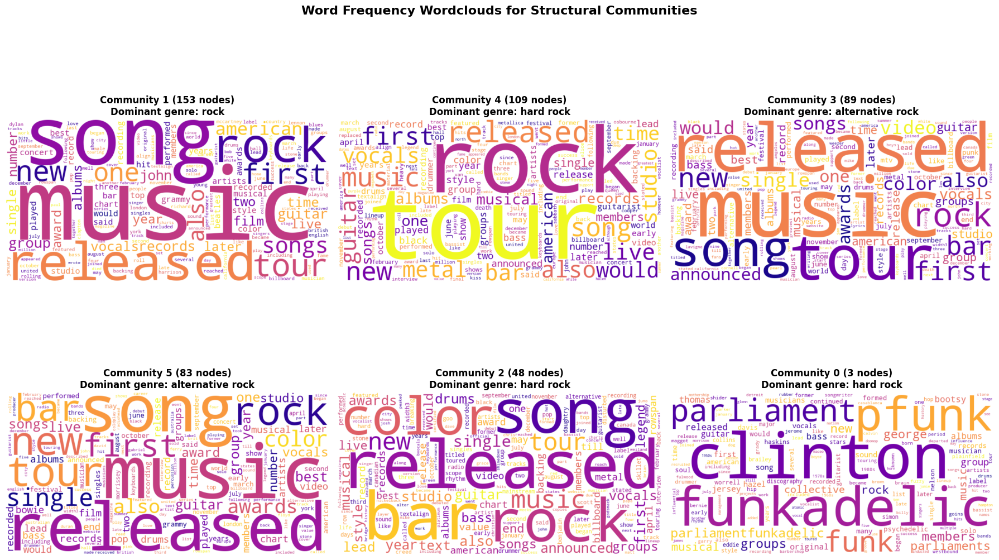

In [47]:
# Step 7: Create wordclouds for communities
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, comm in enumerate(top_7_communities):
    # Create WordCloud from frequencies
    wc = WordCloud(width=800, height=400, 
                   background_color='white',
                   colormap='plasma',
                   relative_scaling=0.5,
                   min_font_size=8)
    
    wc.generate_from_frequencies(community_filtered_counts[comm])
    
    # Get dominant genre for title
    comm_col_idx = top_7_communities.index(comm)
    max_genre_idx = np.argmax(D[:, comm_col_idx])
    dominant_genre = top_7_genres[max_genre_idx]
    comm_size = comm_sizes[idx][1]
    
    axes[idx].imshow(wc, interpolation='bilinear')
    axes[idx].set_title(f'Community {comm} ({comm_size} nodes)\nDominant genre: {dominant_genre}', 
                       fontsize=12, fontweight='bold')
    axes[idx].axis('off')

plt.suptitle('Word Frequency Wordclouds for Structural Communities', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

## Part 4: Sentiment of the Artists and Communities

TODO humanize

### Sentiment Distribution

In this section, we analyze the sentiment of artist Wikipedia pages using the LabMT word list. The LabMT (Language Assessment by Mechanical Turk) wordlist provides happiness scores for common English words, allowing us to calculate an overall sentiment score for text.

**What is LabMT?**
- Crowdsourced happiness ratings for ~10,000 words
- Each word has a score from 1 (sad) to 9 (happy)
- Based on human evaluations of word happiness
- From: [Temporal Patterns of Happiness and Information in a Global Social Network](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752)

**Why measure sentiment?**
Wikipedia articles about artists contain information about:
- Career successes and failures
- Critical reception
- Personal struggles or achievements
- Cultural impact

The sentiment scores can reveal whether an artist's Wikipedia page has predominantly positive or negative language.

In [48]:
# Step 1: Load LabMT wordlist from file

labmt_dict = {}

with open('Data_Set_S1.txt', 'r') as f:
    # Skip header lines (first 3 lines: title, description, column headers)
    for _ in range(3):
        next(f)
    
    # Read the rest of the file
    for line in f:
        parts = line.strip().split('\t')
        if len(parts) >= 3:
            word = parts[0].lower()
            try:
                happiness_score = float(parts[2])
                labmt_dict[word] = happiness_score
            except ValueError:
                # Skip lines that can't be converted (just in case)
                continue

print(f"Loaded {len(labmt_dict)} words from LabMT wordlist")
print(f"\nExample scores:")
print(f"  'happy': {labmt_dict.get('happy', 'N/A')}")
print(f"  'sad': {labmt_dict.get('sad', 'N/A')}")
print(f"  'music': {labmt_dict.get('music', 'N/A')}")
print(f"  'death': {labmt_dict.get('death', 'N/A')}")

# Function to compute sentiment
def compute_sentiment(tokens, labmt_dict):
    """
    Compute average sentiment for a list of tokens based on LabMT scores.
    Returns average happiness score (1-9), or None if no tokens match.
    """
    scores = [labmt_dict[t] for t in tokens if t in labmt_dict]
    if scores:
        return sum(scores) / len(scores)
    else:
        return None

Loaded 10222 words from LabMT wordlist

Example scores:
  'happy': 8.3
  'sad': 2.38
  'music': 8.02
  'death': 1.54


In [49]:
# Step 2: Calculate sentiment for all artists

for node in G_genre.nodes():
    # Find the row in dataframe
    artist_name = node.strip('[]')
    
    # Get the tokens (reuse clean_text from Part 3)
    df_row = df[df['title'].str.strip('[]') == artist_name]
    
    if not df_row.empty:
        tokens = clean_text(df_row.iloc[0]['wikiarticle'])
        sentiment = compute_sentiment(tokens, labmt_dict)
        G_genre.nodes[node]['sentiment'] = sentiment

# Extract sentiments
sentiments = [data['sentiment'] for node, data in G_genre.nodes(data=True) 
              if data.get('sentiment') is not None]

print(f"\nCalculated sentiment for {len(sentiments)} artists")

# Show sample
sample_nodes = list(G_genre.nodes(data=True))[:5]
print("\nSample artists:")
for node, data in sample_nodes:
    if 'sentiment' in data:
        print(f"  {node}: {data['sentiment']:.4f}")


Calculated sentiment for 485 artists

Sample artists:
  [[10cc]]: 5.8347
  [[Simon & Garfunkel]]: 5.9020
  [[ABBA]]: 5.9414
  [[The Yardbirds]]: 5.7889
  [[Asia (band)|Asia]]: 5.8906


In [50]:
# Step 3: Calculate statistics
mean_sentiment = np.mean(sentiments)
median_sentiment = np.median(sentiments)
variance_sentiment = np.var(sentiments)
percentile_25 = np.percentile(sentiments, 25)
percentile_75 = np.percentile(sentiments, 75)

print("=" * 60)
print("SENTIMENT STATISTICS")
print("=" * 60)
print(f"Mean sentiment: {mean_sentiment:.4f}")
print(f"Median sentiment: {median_sentiment:.4f}")
print(f"Variance: {variance_sentiment:.4f}")
print(f"25th percentile: {percentile_25:.4f}")
print(f"75th percentile: {percentile_75:.4f}")
print(f"Min: {np.min(sentiments):.4f}")
print(f"Max: {np.max(sentiments):.4f}")

SENTIMENT STATISTICS
Mean sentiment: 5.8673
Median sentiment: 5.8707
Variance: 0.0079
25th percentile: 5.8181
75th percentile: 5.9262
Min: 5.5607
Max: 6.1442


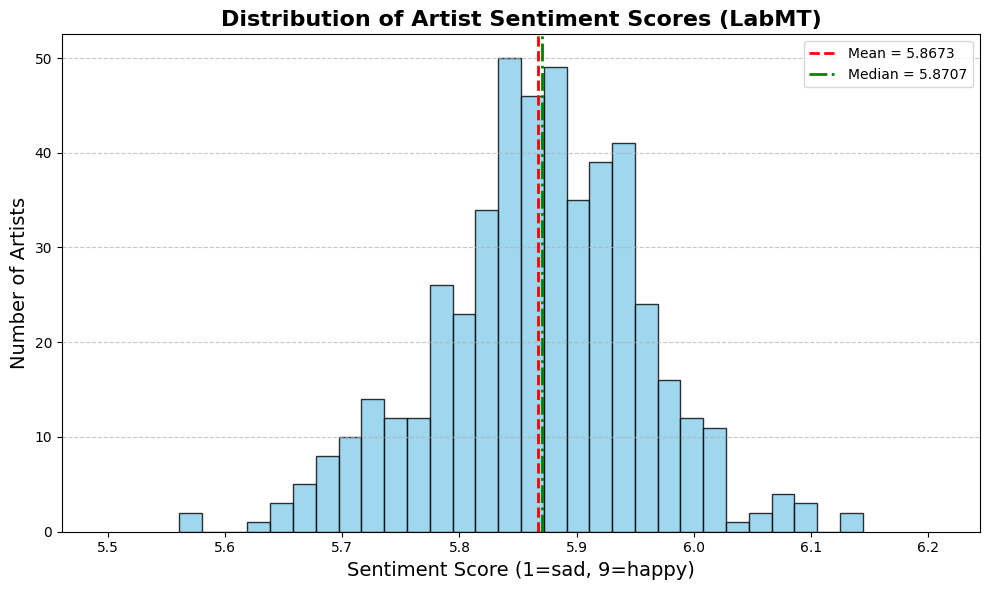

In [51]:
# Step 4: Create histogram
plt.figure(figsize=(10, 6))
plt.hist(sentiments, bins=30, color='skyblue', edgecolor='black', alpha=0.8)

# Add vertical lines for mean and median
plt.axvline(mean_sentiment, color='red', linestyle='--', linewidth=2, 
            label=f'Mean = {mean_sentiment:.4f}')
plt.axvline(median_sentiment, color='green', linestyle='-.', linewidth=2, 
            label=f'Median = {median_sentiment:.4f}')

plt.title("Distribution of Artist Sentiment Scores (LabMT)", fontsize=16, fontweight='bold')
plt.xlabel("Sentiment Score (1=sad, 9=happy)", fontsize=14)
plt.ylabel("Number of Artists", fontsize=14)
plt.xlim(min(sentiments) - 0.1, max(sentiments) + 0.1)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

In [52]:
# Step 5: Find happiest and saddest artists
# Sort by sentiment
sorted_artists = sorted([(node, data['sentiment']) for node, data in G_genre.nodes(data=True) 
                         if data.get('sentiment') is not None],
                       key=lambda x: x[1], reverse=True)

print("=" * 70)
print("TOP 10 HAPPIEST ARTIST PAGES")
print("=" * 70)
for i, (artist, score) in enumerate(sorted_artists[:10], 1):
    print(f"{i:2d}. {artist:50s} - Score: {score:.4f}")

print("\n" + "=" * 70)
print("TOP 10 SADDEST ARTIST PAGES")
print("=" * 70)
for i, (artist, score) in enumerate(sorted_artists[-10:], 1):
    print(f"{i:2d}. {artist:50s} - Score: {score:.4f}")

TOP 10 HAPPIEST ARTIST PAGES
 1. [[Tracy Chapman]]                                  - Score: 6.1442
 2. [[Lenny Kravitz]]                                  - Score: 6.1419
 3. [[Fun (band)|Fun.]]                                - Score: 6.1000
 4. [[The Boxtones]]                                   - Score: 6.0898
 5. [[The Cardigans]]                                  - Score: 6.0886
 6. [[Air Supply]]                                     - Score: 6.0819
 7. [[Michael Martin Murphey]]                         - Score: 6.0811
 8. [[Icehouse (band)|Icehouse]]                       - Score: 6.0810
 9. [[Kenny Loggins]]                                  - Score: 6.0713
10. [[Travis (band)|Travis]]                           - Score: 6.0553

TOP 10 SADDEST ARTIST PAGES
 1. [[Black Sabbath]]                                  - Score: 5.6738
 2. [[Quiet Riot]]                                     - Score: 5.6719
 3. [[Canned Heat]]                                    - Score: 5.6688
 4. [[Skid Row (Ame

In [53]:
# Step 6: Compare community sentiments to overall distribution
# Create data structure for community sentiments
community_sentiment_data = {comm: [] for comm in top_7_communities}

for node, data in G_genre.nodes(data=True):
    if 'sentiment' in data and data['sentiment'] is not None:
        comm = node_to_community.get(node)
        if comm in top_7_communities:
            community_sentiment_data[comm].append(data['sentiment'])

print("\nCommunity sentiment statistics:")
print("=" * 80)
for comm in top_7_communities:
    scores = community_sentiment_data[comm]
    if scores:
        mean_score = np.mean(scores)
        median_score = np.median(scores)
        std_score = np.std(scores)
        
        # Find dominant genre for this community
        comm_col_idx = top_7_communities.index(comm)
        max_genre_idx = np.argmax(D[:, comm_col_idx])
        dominant_genre = top_7_genres[max_genre_idx]
        
        print(f"Community {comm} ({dominant_genre}):")
        print(f"  Mean: {mean_score:.4f}, Median: {median_score:.4f}, Std: {std_score:.4f}")
        print(f"  Range: [{min(scores):.4f}, {max(scores):.4f}]")
        print()


Community sentiment statistics:
Community 1 (rock):
  Mean: 5.8635, Median: 5.8638, Std: 0.0824
  Range: [5.5607, 6.1419]

Community 4 (hard rock):
  Mean: 5.8230, Median: 5.8342, Std: 0.0913
  Range: [5.5755, 6.0079]

Community 3 (alternative rock):
  Mean: 5.8763, Median: 5.8786, Std: 0.0778
  Range: [5.6399, 6.1000]

Community 5 (alternative rock):
  Mean: 5.9147, Median: 5.9214, Std: 0.0864
  Range: [5.6790, 6.0886]

Community 2 (hard rock):
  Mean: 5.8860, Median: 5.8869, Std: 0.0769
  Range: [5.7096, 6.1442]

Community 0 (hard rock):
  Mean: 5.7876, Median: 5.8225, Std: 0.0501
  Range: [5.7167, 5.8235]



/var/folders/h2/yl2gtgcs0010p0b86w781xsc0000gn/T/ipykernel_56057/4003880581.py:8: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[0].boxplot(data_for_boxplot, labels=labels_for_boxplot,


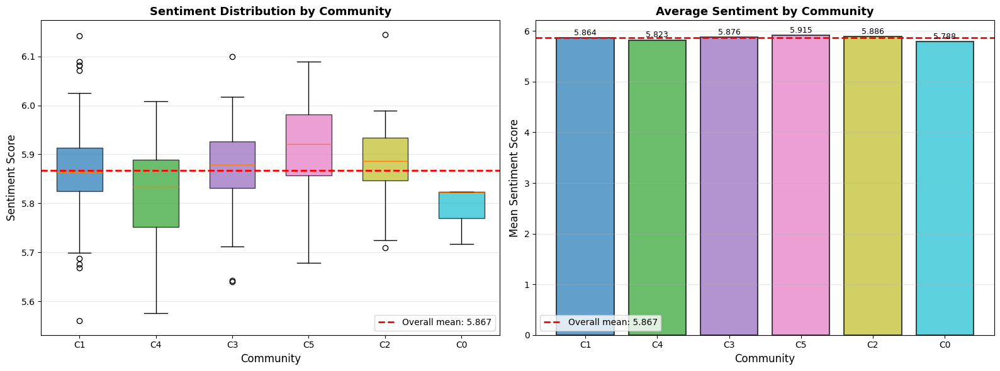

In [54]:
# Step 7: Visualize community sentiment distributions
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: Box plot of sentiment by community
data_for_boxplot = [community_sentiment_data[comm] for comm in top_7_communities]
labels_for_boxplot = [f"C{comm}" for comm in top_7_communities]

bp = axes[0].boxplot(data_for_boxplot, labels=labels_for_boxplot,
                      patch_artist=True, widths=0.6)

# Color boxes by community
for idx, (patch, comm) in enumerate(zip(bp['boxes'], top_7_communities)):
    patch.set_facecolor(community_colors[comm])
    patch.set_alpha(0.7)

# Add overall mean line
axes[0].axhline(mean_sentiment, color='red', linestyle='--', linewidth=2, 
                label=f'Overall mean: {mean_sentiment:.3f}')
axes[0].set_xlabel('Community', fontsize=12)
axes[0].set_ylabel('Sentiment Score', fontsize=12)
axes[0].set_title('Sentiment Distribution by Community', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(alpha=0.3, axis='y')

# Right: Bar plot of mean sentiment by community
mean_sentiments_comm = [np.mean(community_sentiment_data[comm]) for comm in top_7_communities]
colors_for_bars = [community_colors[comm] for comm in top_7_communities]

bars = axes[1].bar(range(len(top_7_communities)), mean_sentiments_comm, 
                    color=colors_for_bars, alpha=0.7, edgecolor='black', linewidth=1.5)

# Add overall mean line
axes[1].axhline(mean_sentiment, color='red', linestyle='--', linewidth=2, 
                label=f'Overall mean: {mean_sentiment:.3f}')
axes[1].set_xticks(range(len(top_7_communities)))
axes[1].set_xticklabels([f"C{comm}" for comm in top_7_communities])
axes[1].set_xlabel('Community', fontsize=12)
axes[1].set_ylabel('Mean Sentiment Score', fontsize=12)
axes[1].set_title('Average Sentiment by Community', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(alpha=0.3, axis='y')

# Add value labels on bars
for i, (bar, val) in enumerate(zip(bars, mean_sentiments_comm)):
    axes[1].text(bar.get_x() + bar.get_width()/2, val + 0.02,
                 f'{val:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

TODO discussion